In [ ]:
!pip install rsatoolbox


   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 656.0/656.0 kB 7.9 MB/s eta 0:00:00


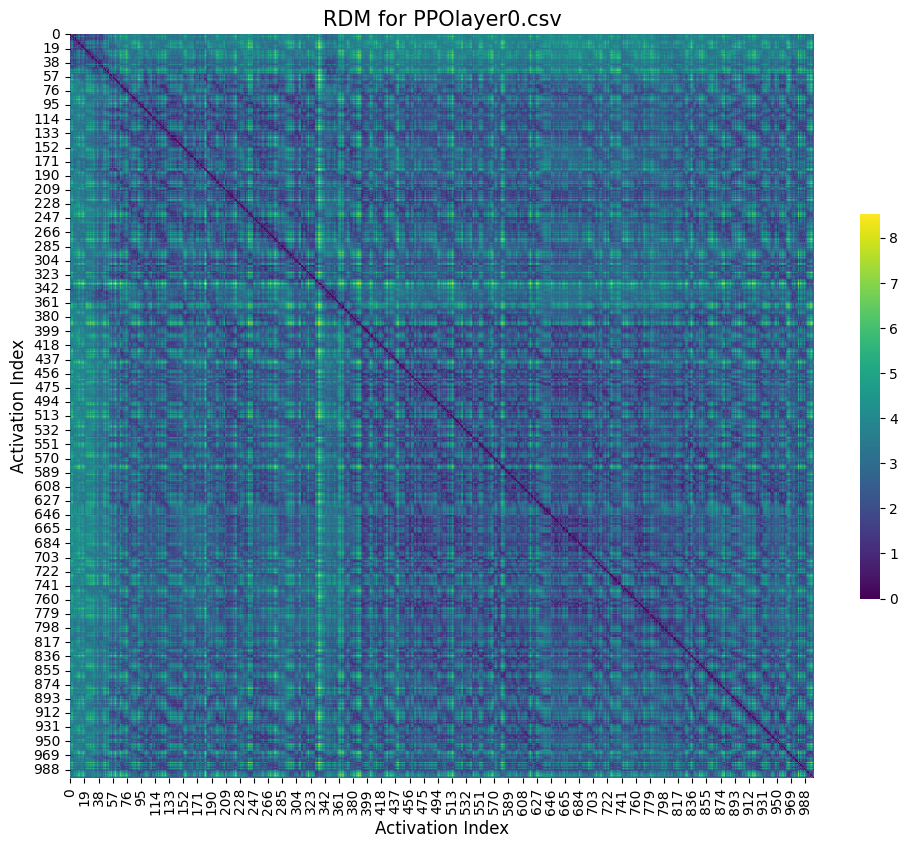

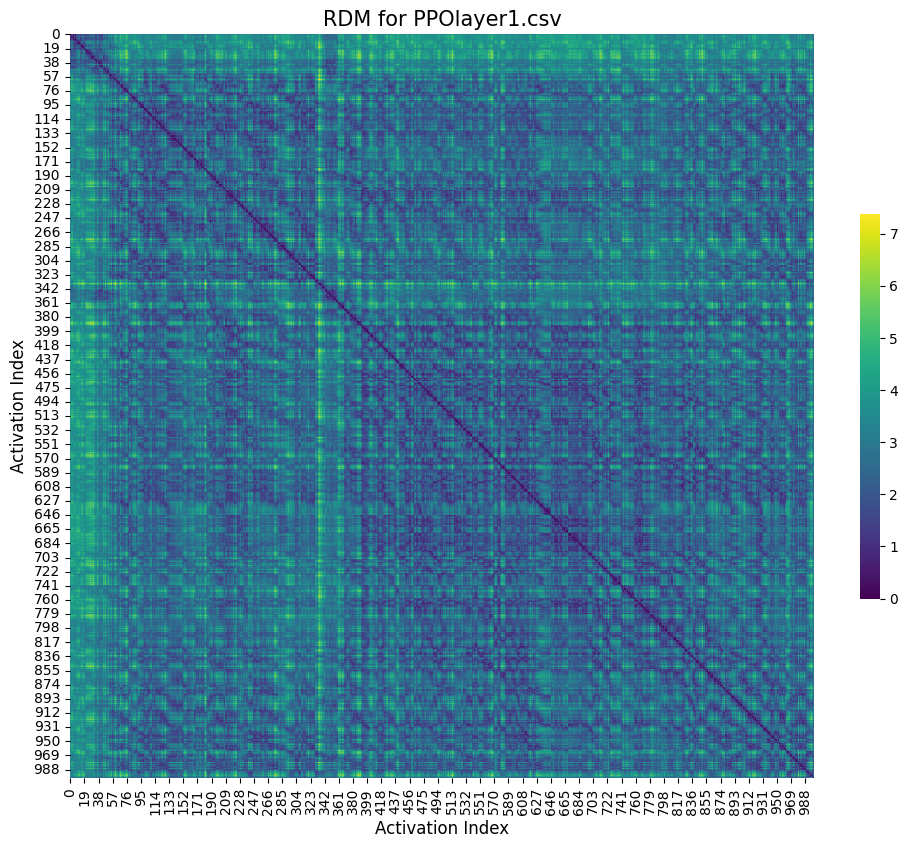

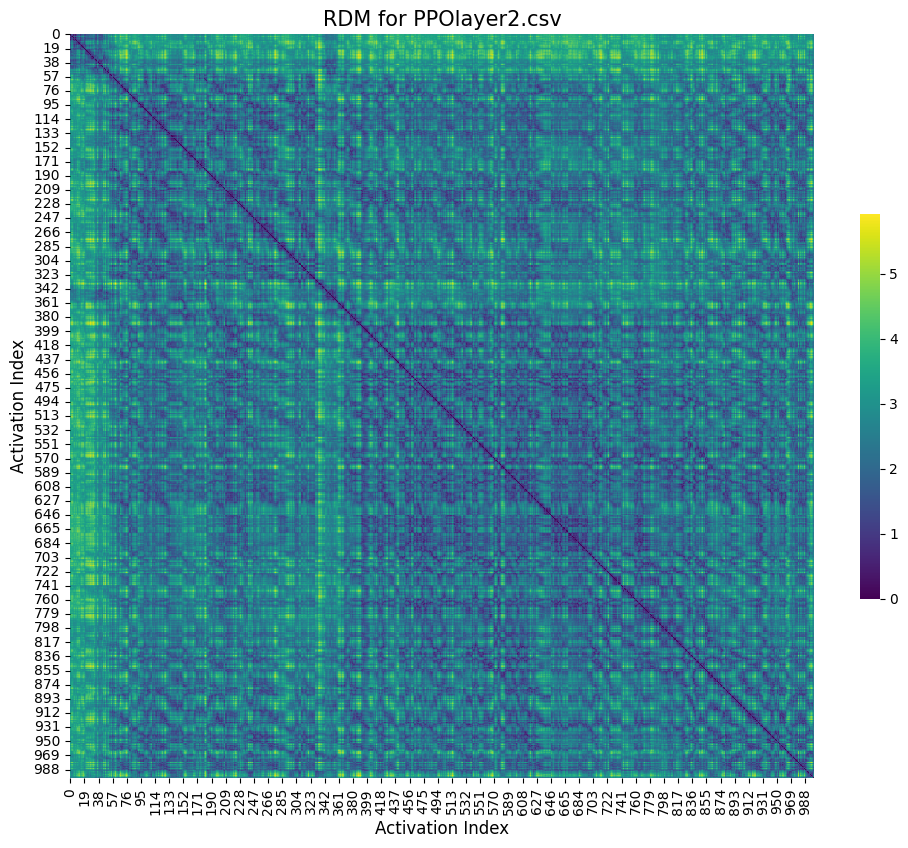

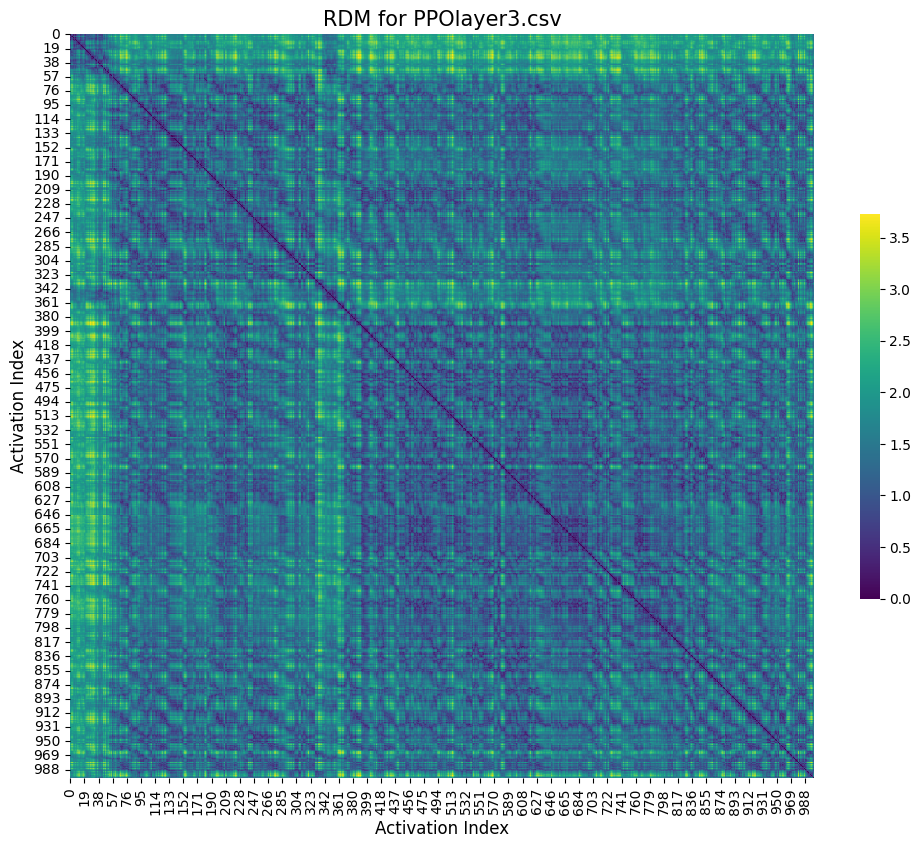

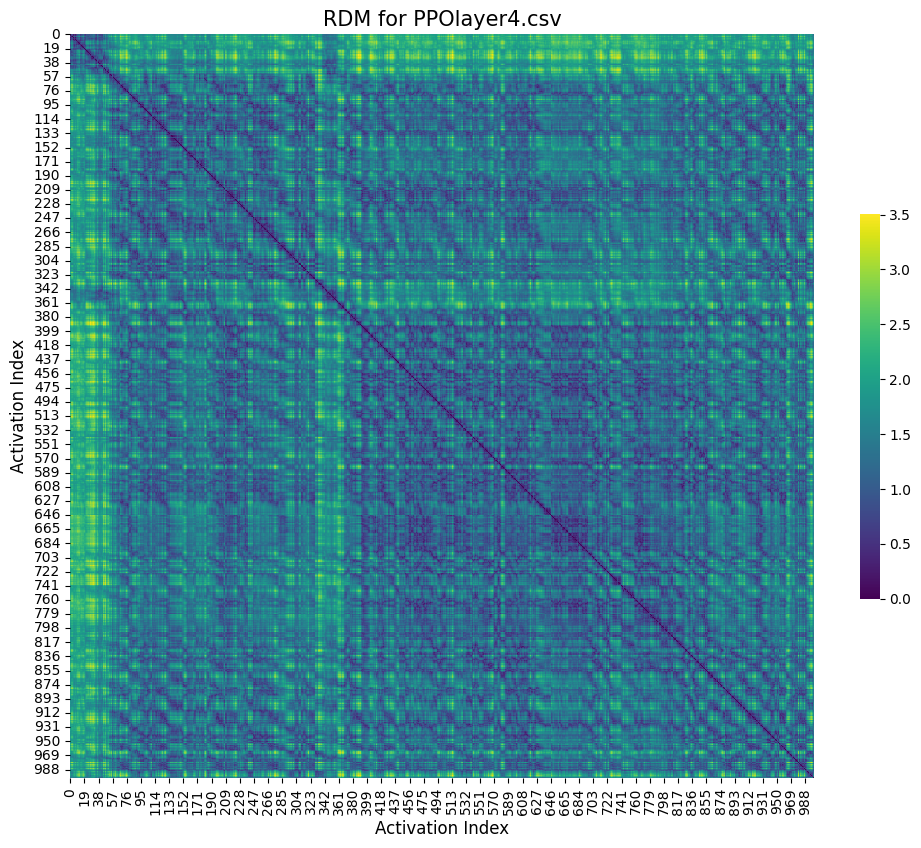

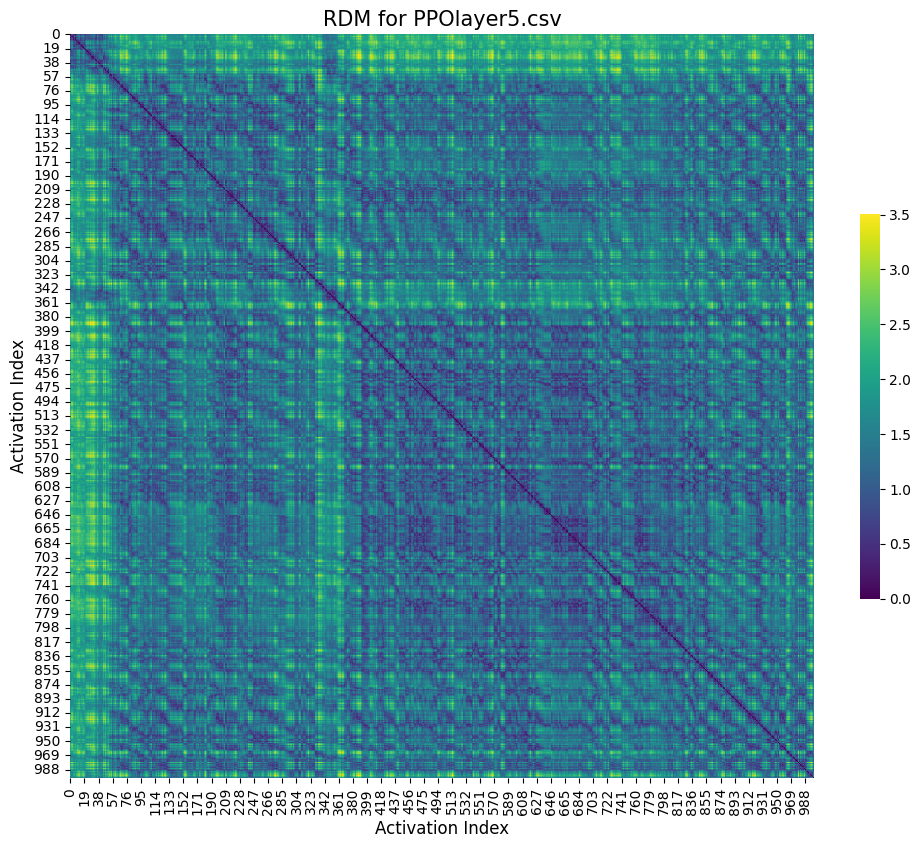

In [ ]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
from scipy.spatial.distance import pdist, squareform

# Load PPO activation data
base_path = '/content/'
ppo_files = [
    'PPOlayer0.csv',
    'PPOlayer1.csv',
    'PPOlayer2.csv',
    'PPOlayer3.csv',
    'PPOlayer4.csv',
    'PPOlayer5.csv'
]

# Read the activation data into a dictionary
ppo_data = {file: pd.read_csv(base_path + file).values for file in ppo_files}

# Function to compute the RDM
def compute_rdm(activations):
    # Compute the pairwise dissimilarities
    dissimilarities = pdist(activations, metric='euclidean')
    # Convert the dissimilarities into a square matrix form (RDM)
    rdm = squareform(dissimilarities)
    return rdm

# Compute RDMs for each layer
mlp_rdms_dict = {layer: compute_rdm(activations) for layer, activations in ppo_data.items()}

# Visualization of RDMs
def plot_rdm(rdm, title):
    plt.figure(figsize=(12, 10))
    sns.heatmap(rdm, cmap='viridis', square=True, cbar_kws={'shrink': .5})
    plt.title(title, fontsize=15)
    plt.xlabel('Activation Index', fontsize=12)
    plt.ylabel('Activation Index', fontsize=12)
    plt.xticks(fontsize=10)
    plt.yticks(fontsize=10)
    plt.show()

# Plot RDMs for each layer with improved readability
for layer, rdm in mlp_rdms_dict.items():
    plot_rdm(rdm, title=f'RDM for {layer}')


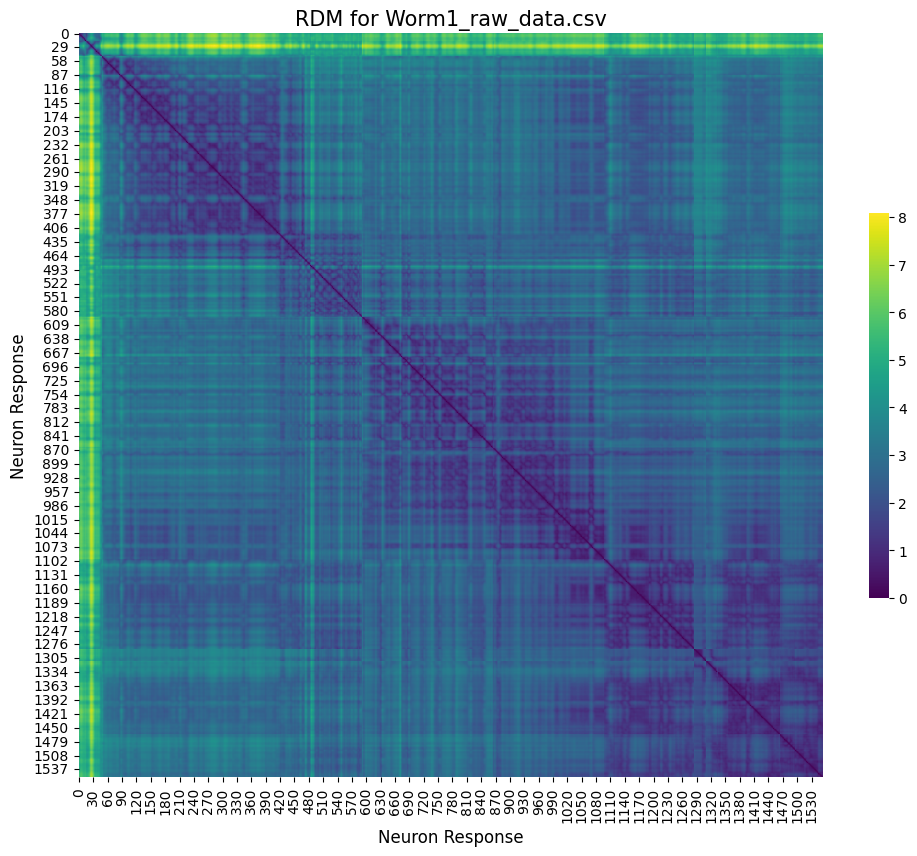

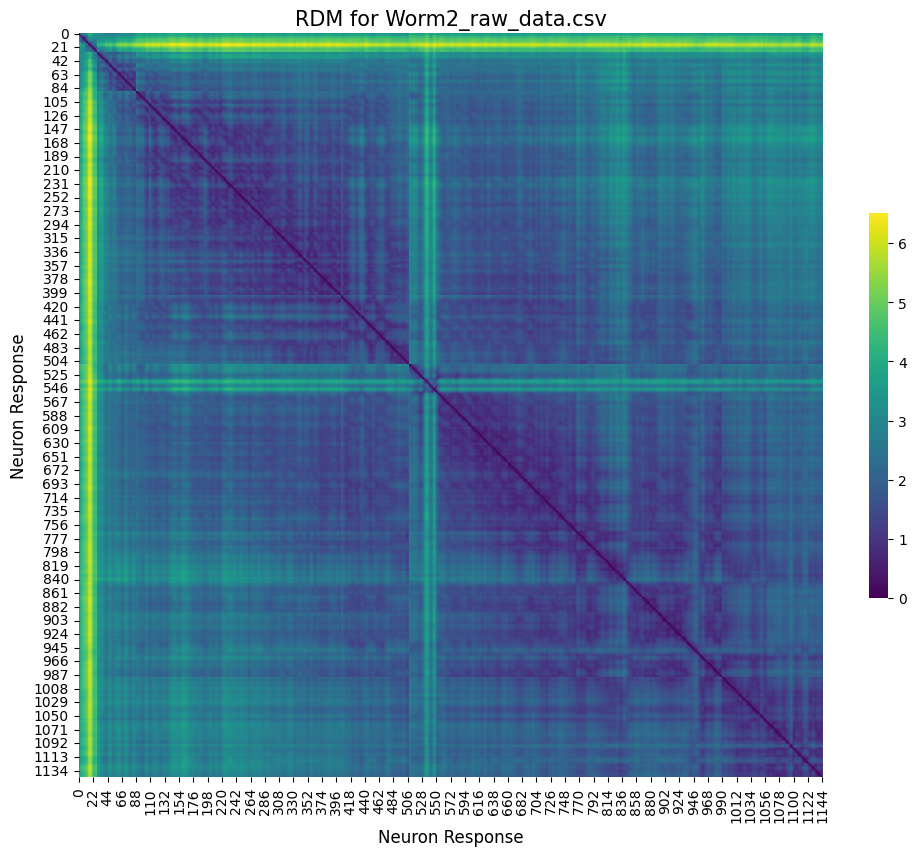

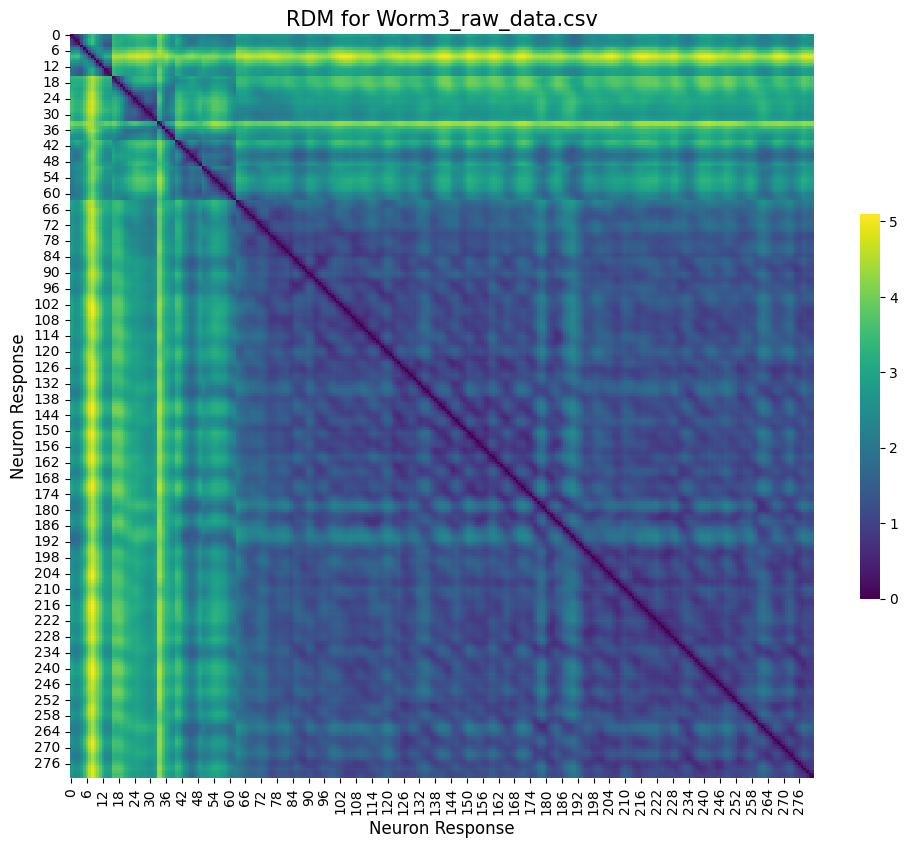

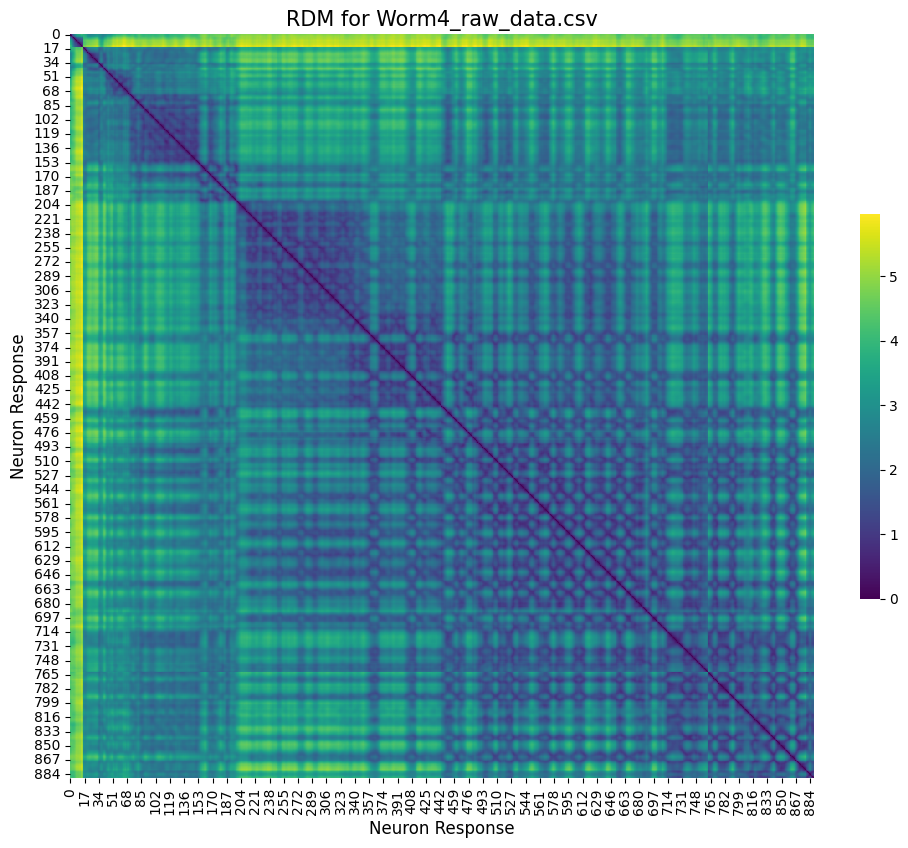

In [ ]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
from scipy.spatial.distance import pdist, squareform

# Base path to the data files
base_path = '/content/'

# Load worm data
worm_files = [
    'Worm1_raw_data.csv',
    'Worm2_raw_data.csv',
    'Worm3_raw_data.csv',
    'Worm4_raw_data.csv'
]

# Read the worm data into a dictionary
worm_data = {file: pd.read_csv(base_path + file).values for file in worm_files}

# Function to compute the RDM
def compute_rdm(activations):
    # Compute the pairwise dissimilarities
    dissimilarities = pdist(activations, metric='euclidean')
    # Convert the dissimilarities into a square matrix form (RDM)
    rdm = squareform(dissimilarities)
    return rdm

# Compute RDMs for each worm
worm_rdms_dict = {file: compute_rdm(data) for file, data in worm_data.items()}

# Visualization of RDMs
def plot_rdm(rdm, title):
    plt.figure(figsize=(12, 10))
    sns.heatmap(rdm, cmap='viridis', square=True, cbar_kws={'shrink': .5})
    plt.title(title, fontsize=15)
    plt.xlabel('Neuron Response', fontsize=12)
    plt.ylabel('Neuron Response', fontsize=12)
    plt.xticks(fontsize=10)
    plt.yticks(fontsize=10)
    plt.show()

# Plot RDMs for each worm with improved readability
for worm, rdm in worm_rdms_dict.items():
    plot_rdm(rdm, title=f'RDM for {worm}')


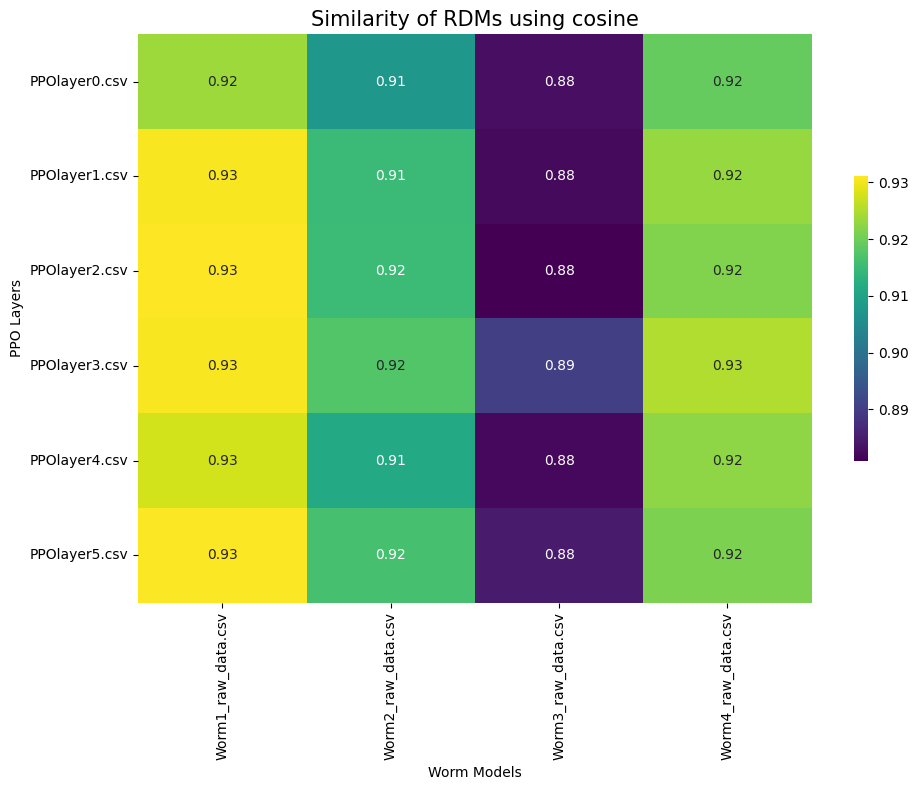

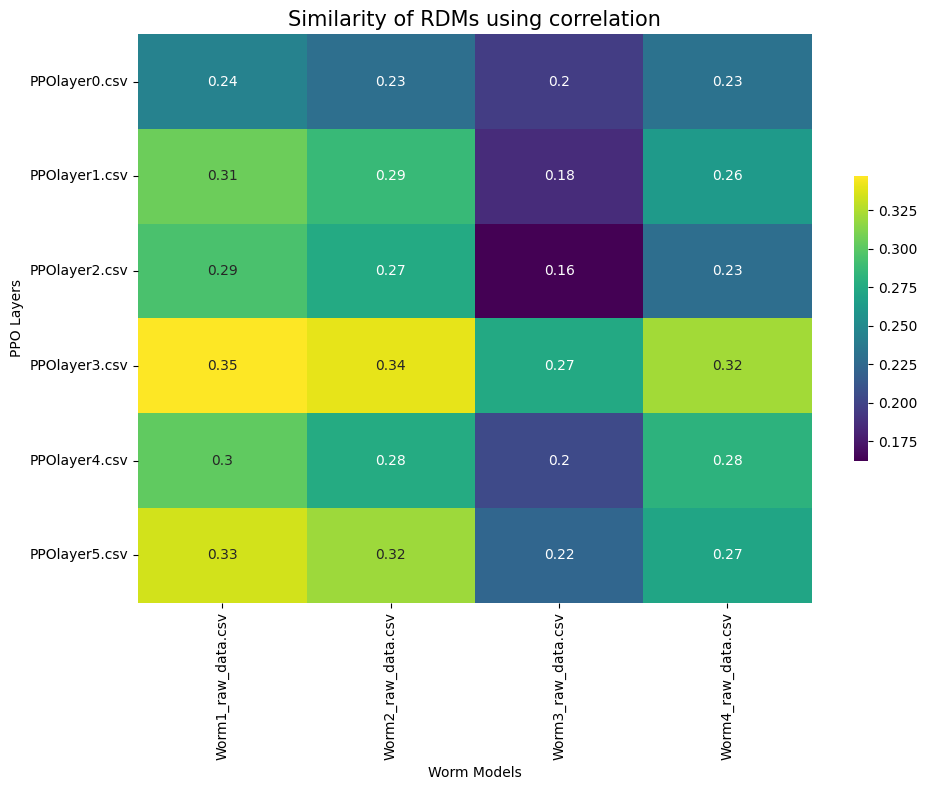

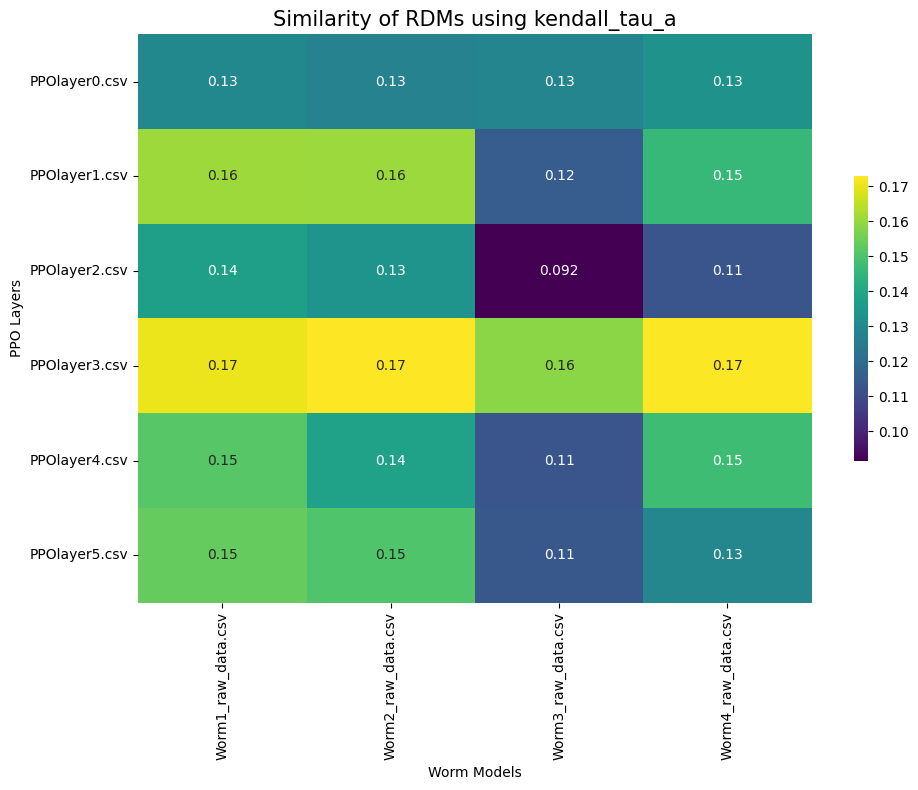

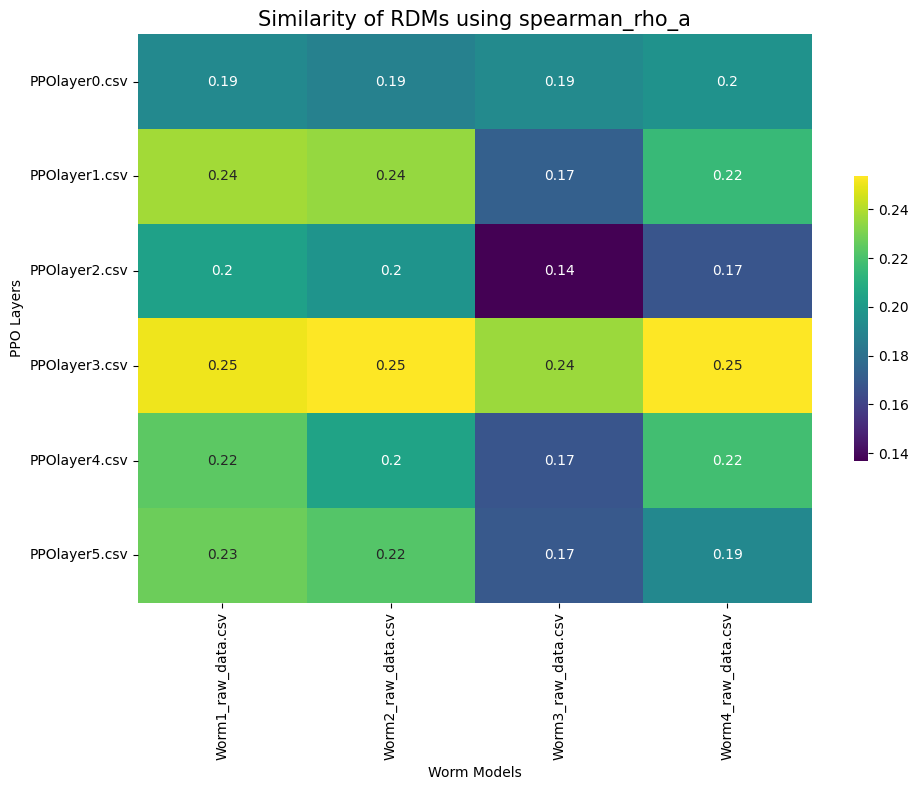


Results using cosine:
[[0.92369189 0.90757354 0.88291114 0.91925457]
 [0.93053844 0.9148591  0.8821835  0.92316154]
 [0.93104162 0.91502111 0.88099051 0.92149605]
 [0.93062594 0.91738983 0.89037381 0.92514131]
 [0.92754968 0.91114751 0.88215787 0.9224404 ]
 [0.93075712 0.91630649 0.88459995 0.92123396]]

Results using correlation:
[[0.24456055 0.22933992 0.19563123 0.23191463]
 [0.30579245 0.28657791 0.18497324 0.26252204]
 [0.29396247 0.27434062 0.16251222 0.22869265]
 [0.34701551 0.33982903 0.27414339 0.3212576 ]
 [0.30165115 0.27546593 0.20384217 0.2807455 ]
 [0.33423962 0.31988958 0.22280291 0.27122032]]

Results using kendall_tau_a:
[[0.12947883 0.127303   0.12868606 0.13302752]
 [0.16090141 0.16048328 0.11533466 0.14610166]
 [0.13724282 0.13372105 0.09165914 0.1129304 ]
 [0.17051645 0.17274279 0.15869435 0.1721752 ]
 [0.15151822 0.13832068 0.11305157 0.14753294]
 [0.15367316 0.15037273 0.11373471 0.12907854]]

Results using spearman_rho_a:
[[0.19162077 0.18776695 0.19207875 0.19

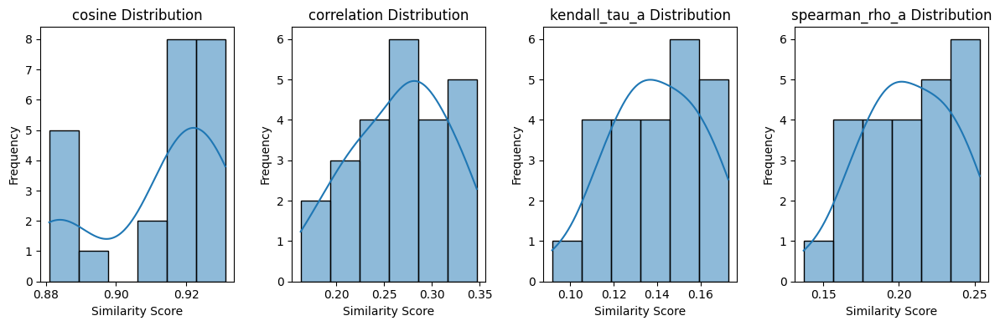

In [25]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
from scipy.spatial.distance import pdist, squareform
from scipy import stats

# Load PPO activation data
base_path = '/content/'
ppo_files = [
    'PPOlayer0.csv',
    'PPOlayer1.csv',
    'PPOlayer2.csv',
    'PPOlayer3.csv',
    'PPOlayer4.csv',
    'PPOlayer5.csv'
]

# Read the activation data into a dictionary
ppo_data = {file: pd.read_csv(base_path + file).values for file in ppo_files}

# Load worm data
worm_files = [
    'Worm1_raw_data.csv',
    'Worm2_raw_data.csv',
    'Worm3_raw_data.csv',
    'Worm4_raw_data.csv'
]

# Read the worm data into a dictionary
worm_data = {file: pd.read_csv(base_path + file).values for file in worm_files}

# Function to compute the RDM
def compute_rdm(activations):
    dissimilarities = pdist(activations, metric='euclidean')
    rdm = squareform(dissimilarities)
    return rdm

# Function to sample data to a specific size
def sample_data(data, target_size):
    if data.shape[0] > target_size:
        indices = np.sort(np.random.choice(data.shape[0], target_size, replace=False))
        return data[indices]
    else:
        return data

# Find the smallest dataset size
min_size = min(min(data.shape[0] for data in ppo_data.values()),
               min(data.shape[0] for data in worm_data.values()))

# Use a smaller size for RDM computation to keep memory usage manageable
rdm_size = min(min_size, 1000)  # Adjust this value as needed

# Sample and compute RDMs for each dataset
ppo_rdms = {file: compute_rdm(sample_data(data, rdm_size)) for file, data in ppo_data.items()}
worm_rdms = {file: compute_rdm(sample_data(data, rdm_size)) for file, data in worm_data.items()}

# Functions to compute similarity between two RDMs
def cosine_similarity(rdm1, rdm2):
    v1 = rdm1[np.triu_indices(rdm1.shape[0], k=1)]
    v2 = rdm2[np.triu_indices(rdm2.shape[0], k=1)]
    return np.dot(v1, v2) / (np.linalg.norm(v1) * np.linalg.norm(v2))

def correlation_similarity(rdm1, rdm2):
    v1 = rdm1[np.triu_indices(rdm1.shape[0], k=1)]
    v2 = rdm2[np.triu_indices(rdm2.shape[0], k=1)]
    return np.corrcoef(v1, v2)[0, 1]

def kendall_tau_a(rdm1, rdm2):
    v1 = rdm1[np.triu_indices(rdm1.shape[0], k=1)]
    v2 = rdm2[np.triu_indices(rdm2.shape[0], k=1)]
    tau, _ = stats.kendalltau(v1, v2, variant='c')
    return tau

def spearman_rho_a(rdm1, rdm2):
    v1 = rdm1[np.triu_indices(rdm1.shape[0], k=1)]
    v2 = rdm2[np.triu_indices(rdm2.shape[0], k=1)]
    rho, _ = stats.spearmanr(v1, v2)
    return rho

# Compute similarities
methods = ['cosine', 'correlation', 'kendall_tau_a', 'spearman_rho_a']
similarity_functions = {
    'cosine': cosine_similarity,
    'correlation': correlation_similarity,
    'kendall_tau_a': kendall_tau_a,
    'spearman_rho_a': spearman_rho_a
}

similarities = {method: np.zeros((len(ppo_rdms), len(worm_rdms))) for method in methods}

for method in methods:
    for i, (ppo_layer, ppo_rdm) in enumerate(ppo_rdms.items()):
        for j, (worm_file, worm_rdm) in enumerate(worm_rdms.items()):
            similarities[method][i, j] = similarity_functions[method](ppo_rdm, worm_rdm)

# Visualization of the comparisons
def plot_comparison_results(similarities, method):
    plt.figure(figsize=(10, 8))
    sns.heatmap(similarities[method], annot=True, cmap='viridis', cbar_kws={'shrink': .5})
    plt.title(f'Similarity of RDMs using {method}', fontsize=15)
    plt.xlabel('Worm Models')
    plt.ylabel('PPO Layers')
    plt.xticks(np.arange(len(worm_rdms)) + 0.5, worm_rdms.keys(), rotation=90)
    plt.yticks(np.arange(len(ppo_rdms)) + 0.5, ppo_rdms.keys(), rotation=0)
    plt.tight_layout()
    plt.show()

# Plot the comparison results
for method in methods:
    plot_comparison_results(similarities, method)

# Print the comparison results
for method, result in similarities.items():
    print(f'\nResults using {method}:')
    print(result)

# Visualize the distribution of similarity scores
plt.figure(figsize=(12, 4))
for i, (method, result) in enumerate(similarities.items()):
    plt.subplot(1, 4, i+1)
    sns.histplot(result.flatten(), kde=True)
    plt.title(f'{method} Distribution')
    plt.xlabel('Similarity Score')
    plt.ylabel('Frequency')
plt.tight_layout()
plt.show()